<a href="https://colab.research.google.com/github/redsriracha/CV_assign1/blob/main/CS4973_5483_assignment1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# UTSA CS 4973/5483: Assignment-1

Spring 2021

**Tran - Richard - (peh215)**

## Learning Objectives

*   Understand the process of image filtering. Create different filters and apply them on images.
*   Implement the operation of blending two images using Laplacian Pyramid.

In [ ]:
# Add only your imports here
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)
import cv2
import os

#Filtering

##Create own filtering function (45 points)

Write a function that performs filtering of an image given a kernel of size NxM, where N and M are both odd.

Padding - implement the mirror technique to avoid the loss of pixels on the image boundary.

##Create filter kernels and perform filtering (15 points)

Use the above created function on a given set of images. Create a kernel for the each of the following filters and perform filtering. Compare the filtered image with the openCV's filter2D function by drawing them side-by-side. Do this for all the non-mask images and plot them in a separate row. Grid size for each filter will be 3 columns (left - your result, middle - original image, right - openCV result) x 6 rows (number of images).

Create a new code block for the following:

*   Gaussian blur filter
*   Box blur filter
*   Sharpening filter
*   Sobel Horizontal filter
*   Sobel Vertical filter

In [ ]:
imgpaths = [imgpath for imgpath in os.listdir('.') if ('.jpg' in imgpath or '.png' in imgpath) and not 'mask' in imgpath] # all the non-mask images
imgs = [cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB) for img in imgpaths]
print(imgpaths)

['robbie.jpg', 'soccerball.jpg', 'ghost-rider.jpg', 'baseball.png', 'nicolas-cage.jpg', 'quinn.jpg']


In [ ]:
def plot_comparison(mine, orig, compare):
    fig, axs = plt.subplots(1,3)
    axs[0].imshow(mine)
    axs[0].set_title('MINE')
    axs[1].imshow(orig)
    axs[1].set_title('ORIGINAL')
    axs[2].imshow(compare)
    axs[2].set_title('CV2')

In [ ]:
# Create your own filtering function
def filter2D(image, kernel):
    image = image / 255
    kernel = kernel.reshape(kernel.shape[0], kernel.shape[1], 1)
    output = np.zeros_like(image)

    kernel_width = kernel.shape[1]
    kernel_height = kernel.shape[0]
    x_padding = kernel_width // 2
    y_padding = kernel_height // 2

    image_padded = cv2.copyMakeBorder(image, y_padding, y_padding, x_padding, x_padding, cv2.BORDER_REFLECT)
    
    for x in range(output.shape[1]):
        for y in range(output.shape[0]):
            roi = image_padded[y: y+kernel_height, x: x+kernel_width]
            output[y, x] = (kernel * roi).sum(axis=0).sum(axis=0)

    return output

[[0.00390625 0.015625   0.0234375  0.015625   0.00390625]
 [0.015625   0.0625     0.09375    0.0625     0.015625  ]
 [0.0234375  0.09375    0.140625   0.09375    0.0234375 ]
 [0.015625   0.0625     0.09375    0.0625     0.015625  ]
 [0.00390625 0.015625   0.0234375  0.015625   0.00390625]]


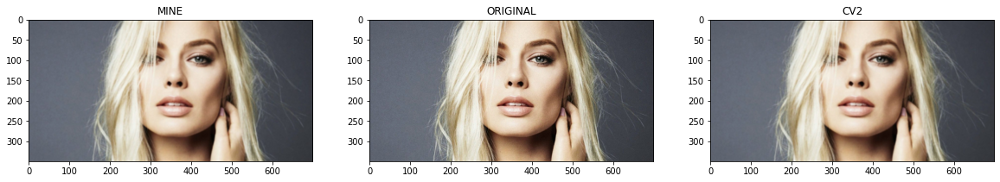

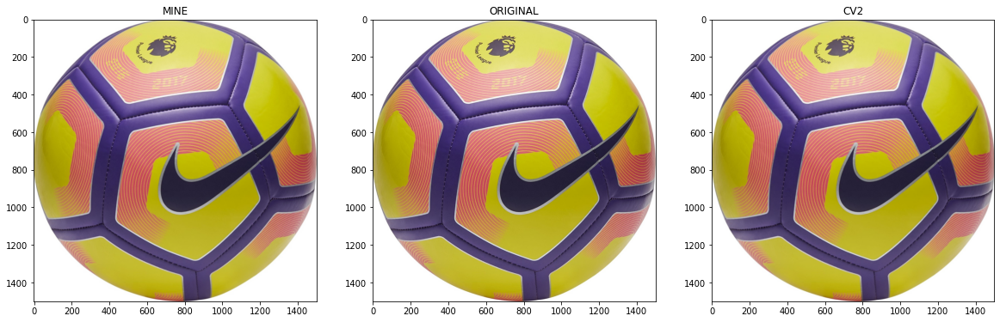

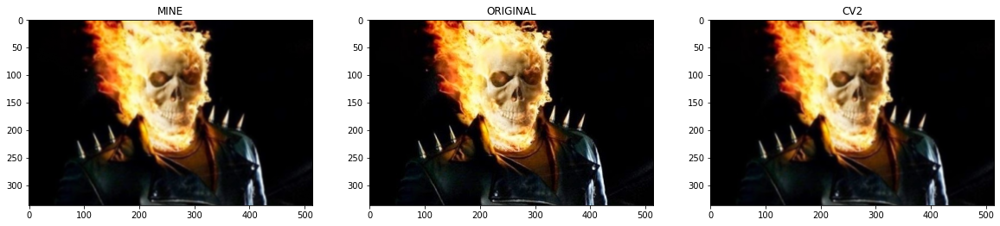

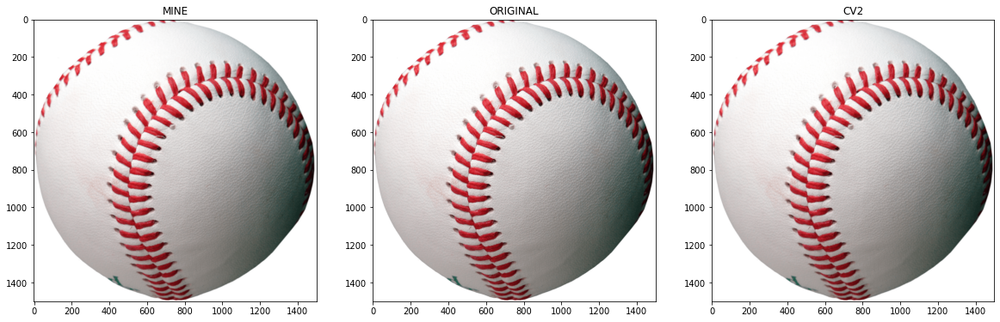

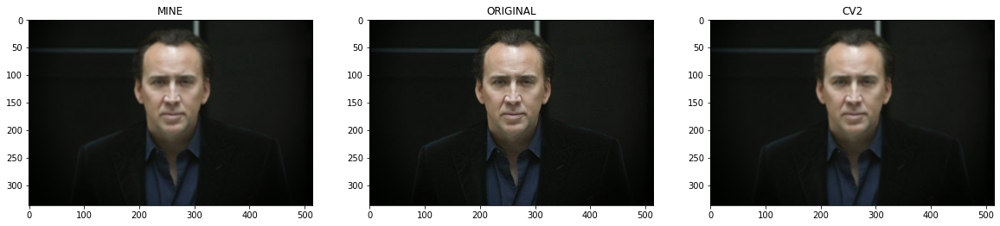

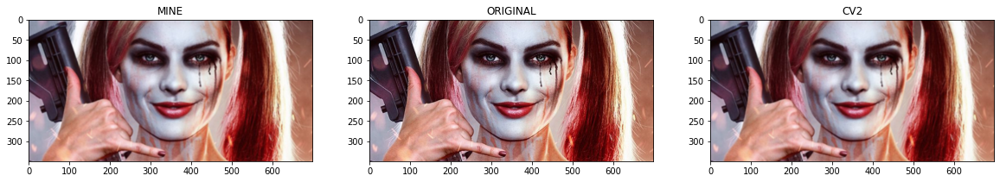

In [ ]:
# Gaussian Blur Filter
def gaussian_blur_filter():
    x = np.array([[1,4,6,4,1]]) / 16
    kernel = x * x.T
    return kernel

kernel = gaussian_blur_filter()
print(kernel)

for img in imgs:
    x = filter2D(img, kernel)
    y = img
    z = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REFLECT)
    plot_comparison(x, y, z)

[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


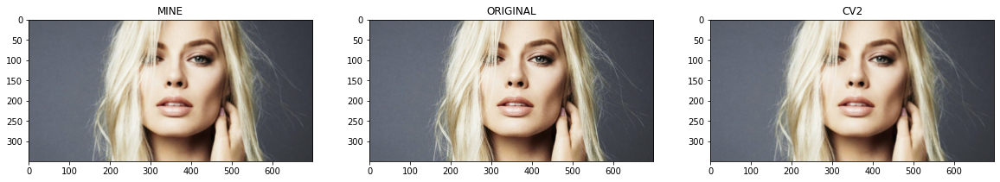

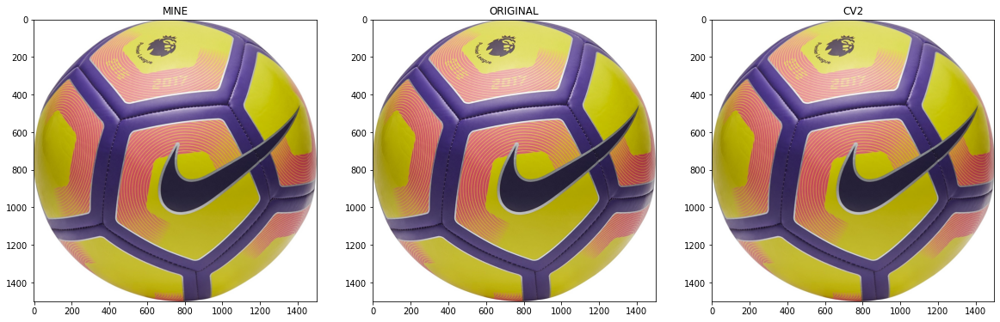

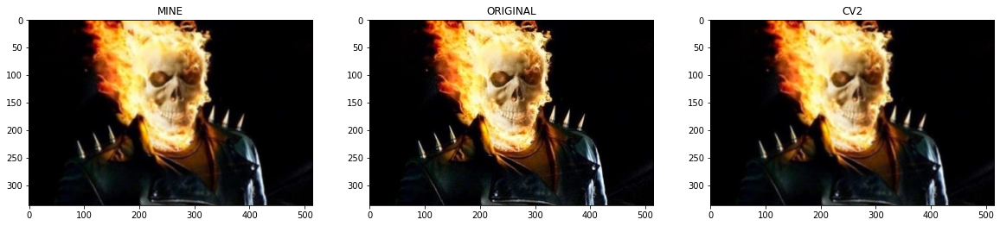

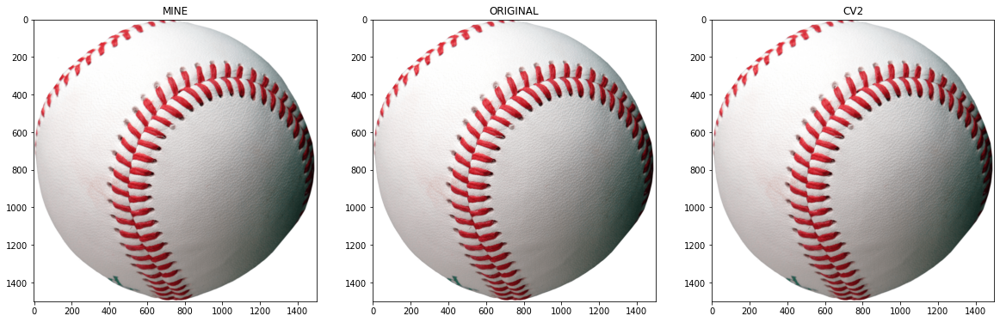

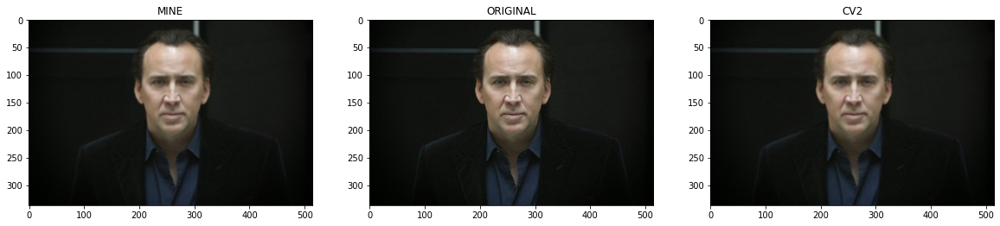

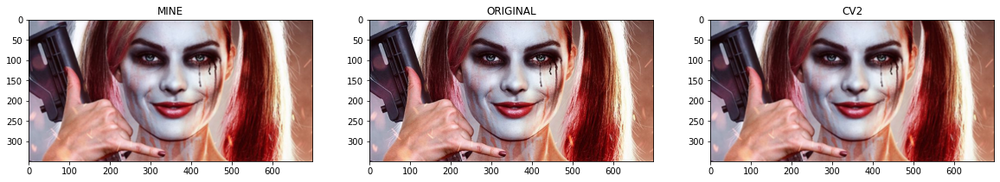

In [ ]:
# Box Blur Filter (DONE)
def box_blur_filter(size):
    x = np.ones((1,size[0])) / size[0]
    y = np.ones((1,size[1])).T / size[1]
    kernal = x * y
    return kernal

shape = (3,3)
kernel = box_blur_filter(shape)
print(kernel)

for img in imgs:
    x = filter2D(img, kernel)
    y = img
    z = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REFLECT)
    plot_comparison(x, y, z)

[[-0.11111111 -0.11111111 -0.11111111]
 [-0.11111111  1.88888889 -0.11111111]
 [-0.11111111 -0.11111111 -0.11111111]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


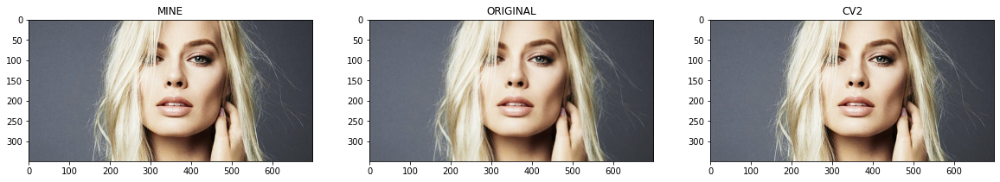

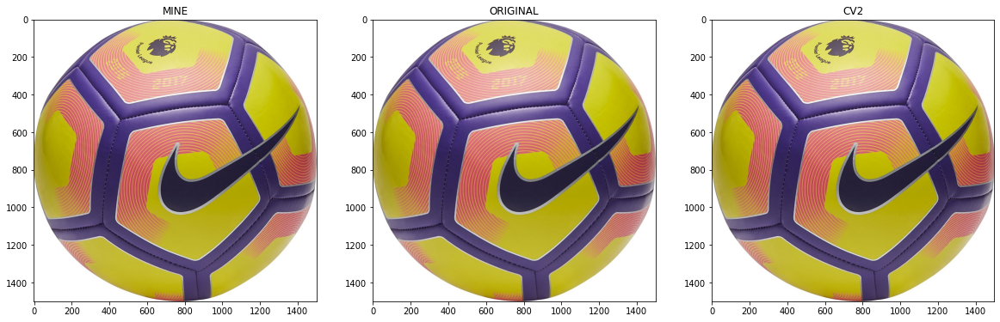

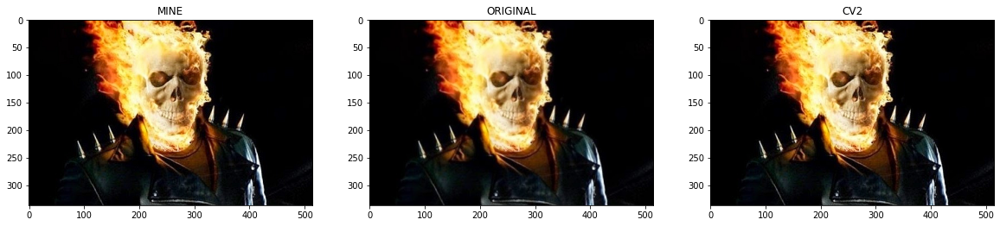

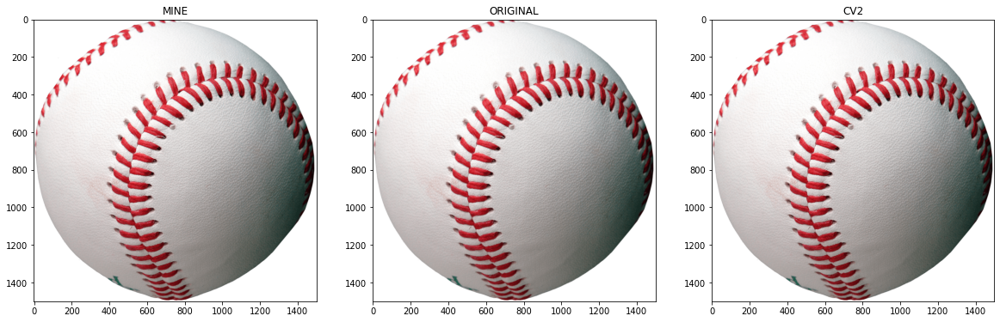

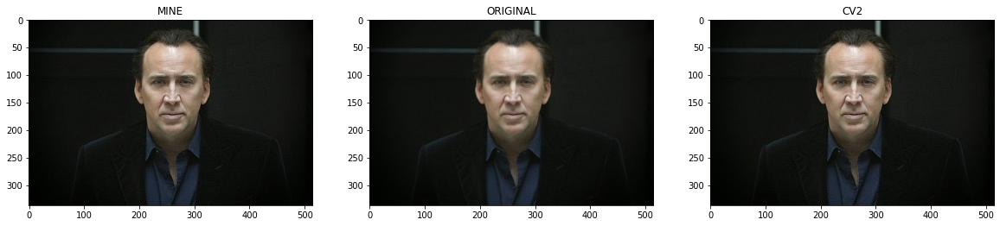

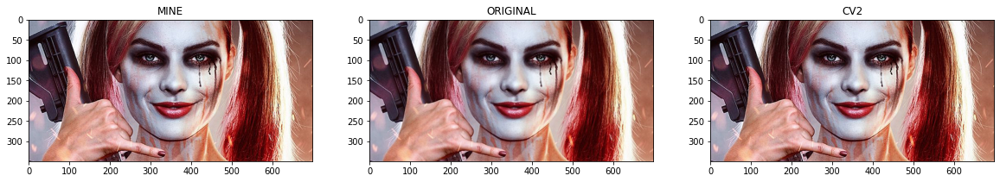

In [ ]:
# Sharpening Filter
def sharpening_filter(size, intensity=2):
    a = np.zeros(size)
    center = (size[0]//2, size[1]//2)
    a[center[0]][center[1]] = intensity
    b = np.ones_like(a) / a.size

    kernal = a - b
    return kernal

shape = (3,3)
kernel = sharpening_filter(shape)
print(kernel)

for img in imgs:
    x = filter2D(img, kernel)
    y = img
    z = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REFLECT)
    plot_comparison(x, y, z)

[[-1  0  1]
 [-2  0  2]
 [-1  0  1]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


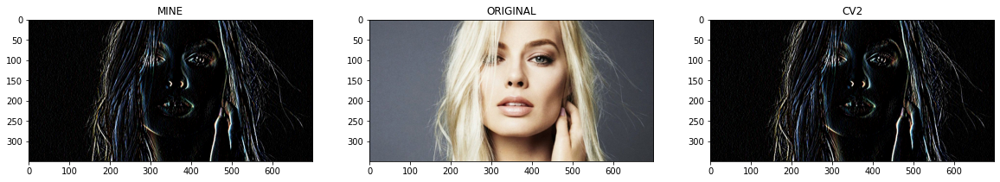

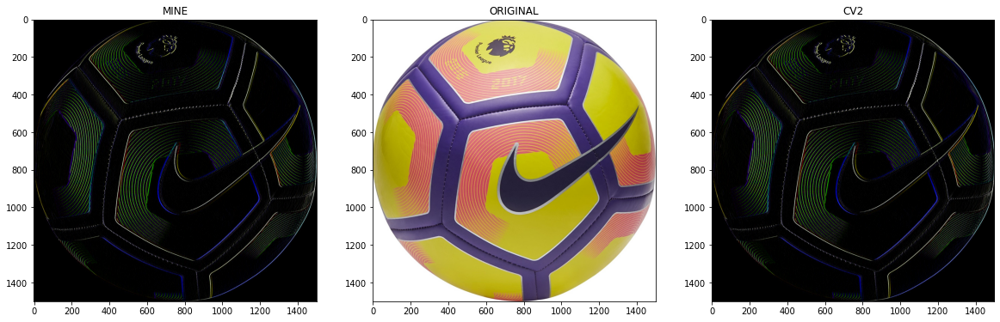

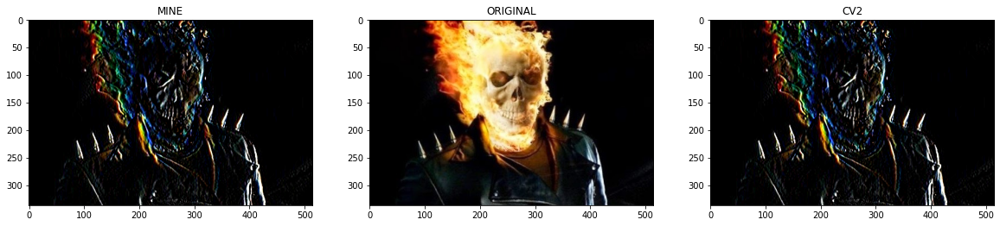

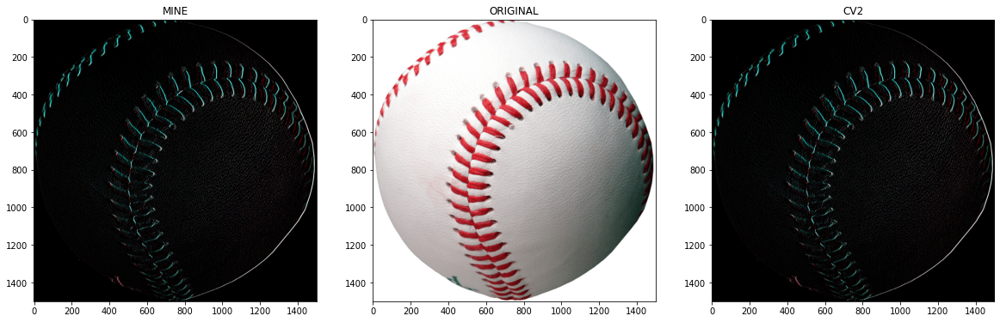

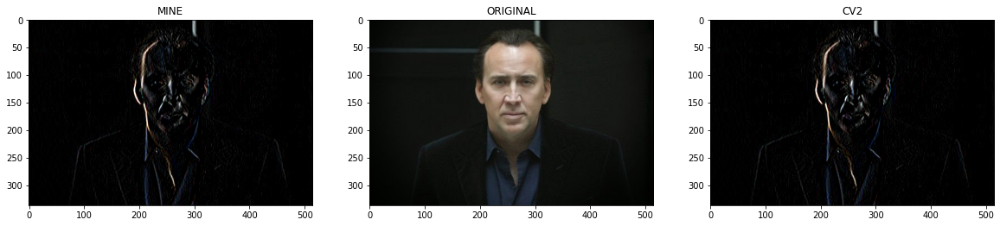

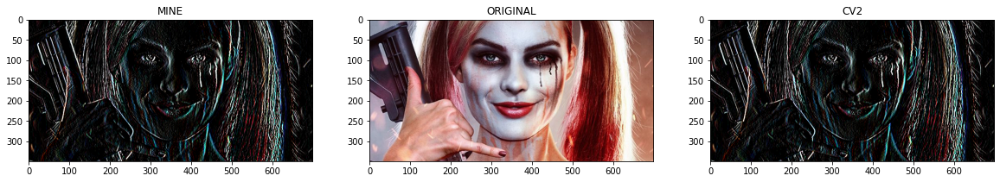

In [ ]:
# Sobel Horizontal Filter (DONE)
def sobel_horizontal_filter(size):
    x = np.array([-1,0,1]).reshape(1,size[0])
    y = np.array([1,2,1]).reshape(1,size[1]).T
    return x*y

shape = (3,3)
kernel = sobel_horizontal_filter(shape)
print(kernel)

for img in imgs:
    x = filter2D(img, kernel)
    y = img
    z = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REFLECT)
    plot_comparison(x, y, z)

[[-1 -2 -1]
 [ 0  0  0]
 [ 1  2  1]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


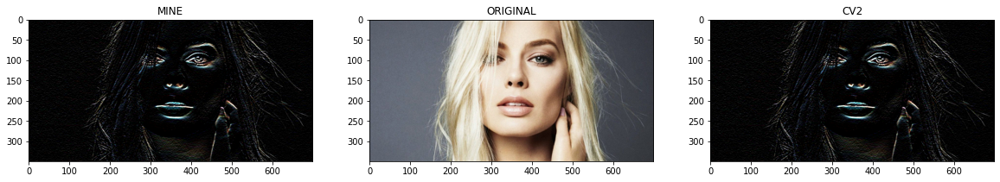

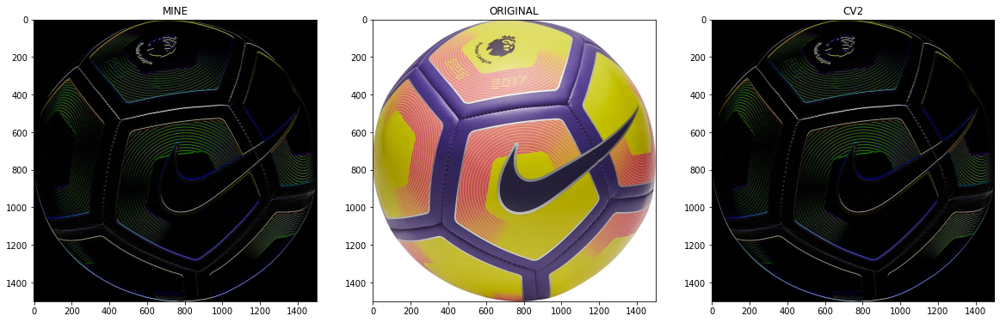

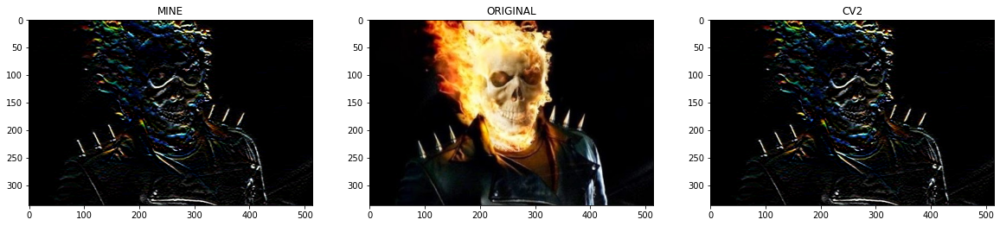

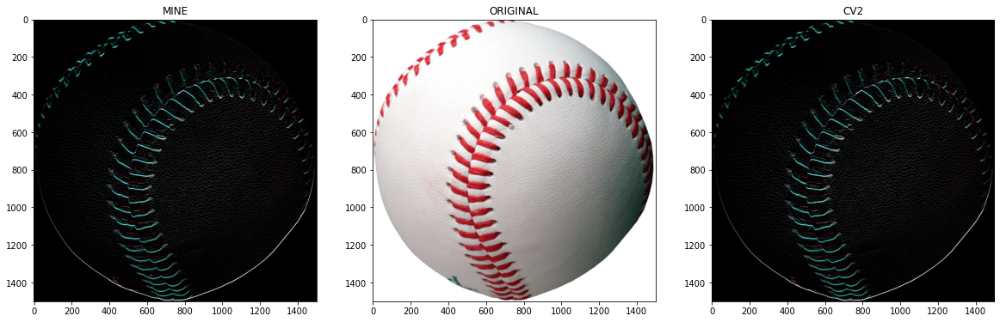

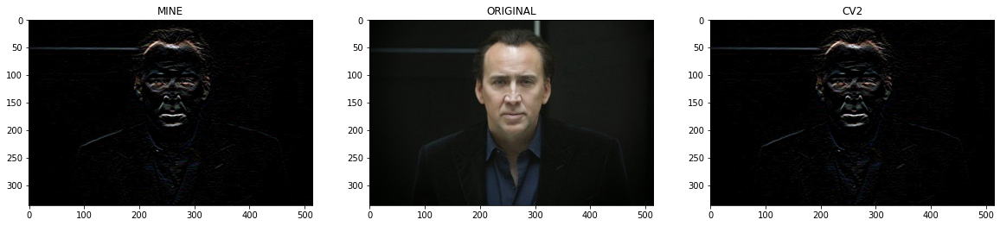

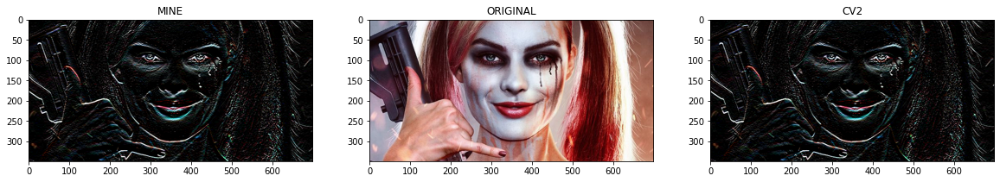

In [ ]:
# Sobel Vertical Filter (DONE)
def sobel_vertical_filter(size):
    x = np.array([1,2,1]).reshape(1,size[0])
    y = np.array([-1,0,1]).reshape(1,size[1]).T
    return x*y

shape = (3,3)
kernel = sobel_vertical_filter(shape)
print(kernel)

for img in imgs:
    x = filter2D(img, kernel)
    y = img
    z = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REFLECT)
    plot_comparison(x, y, z)

# Blending

##Create own function for blending two images (50 points)

Implement a function that blends two given images using the Laplacian Image Pyramid and returns the resultant blended image. Please look at the class slides for the algorithm and the corresponding recorded video for explanation. 

In the lecture, we used left half from image-1 and right half from image-2. Instead, you should use a mask (black/white image) during the merge step. Black indicates take the pixels from image-1 and white indicates take the pixel from image-2.

Your function should take as input 2 images and an option to decide on the number of levels for Laplacian Pyramid. Assume that the images are of the same size.

##Perform blending for give image pairs (15 points)

Apply the above created function on all (3) pairs of images and show the results.

1.   soccerball & baseball
2.   ghost-rider & nicolas-cage
3.   quinn & robbie

As part of your results, you should show the Gaussian Pyramid, Laplacian Pyramid for each of the images in the image pair. You should also show the blend results at each level. Check the lecture slides for the results of the pair "apple & orange". You can show more intermediate results if you would like.

In [ ]:
# Create your own function for blending two images
def blend(img1, img2, mask, level, shape=(3,3)):
    img1 = img1 / 255
    img2 = img2 / 255
    mask = mask / 255

    def get_residual_downsample(img, lvl, shp):
        img_level = []
        residual_level = []
        for i in range(lvl):
            A = img.copy()
            img_level.append(A)

            # GBlur and Downsample
            img = cv2.pyrDown(img)

            # Upsample & GBlur
            B = cv2.pyrUp(img, dstsize=(A.shape[1], A.shape[0]))

            # Save residual
            residual_level.append(A - B)
        return img_level, residual_level, img

    _, img1_residual_level, img1_down = get_residual_downsample(img1, level, shape)
    _, img2_residual_level, img2_down = get_residual_downsample(img2, level, shape)
    mask_level, _, mask_down = get_residual_downsample(mask, level, shape)

    # Apply mask, right on white, and left on black
    combined_residual = []
    for left, right, msk in zip(img1_residual_level, img2_residual_level, mask_level):
        masked = right*msk + left*(1.0 - msk)
        combined_residual.append(masked)
    combined_img = img2_down * mask_down + img1_down * (1.0 - mask_down)

    # Reconstruction - Laplacian Image Pyramid
    for i in range(level-1, -1, -1):
        # Upsample, GBlur then Add residual
        combined_img = cv2.pyrUp(combined_img, dstsize=(combined_residual[i].shape[1], combined_residual[i].shape[0])) 
        combined_img = combined_img + combined_residual[i]
        
    return combined_img

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


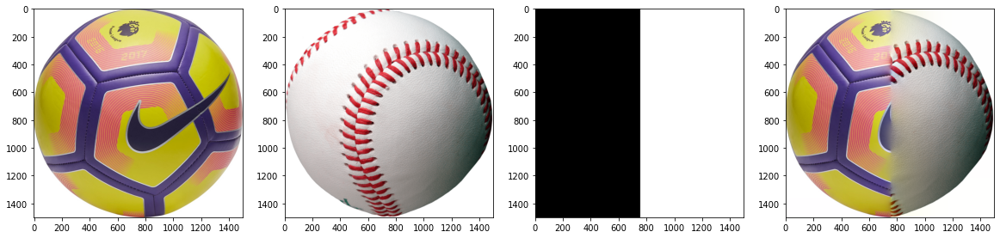

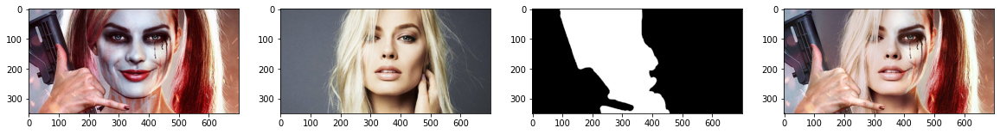

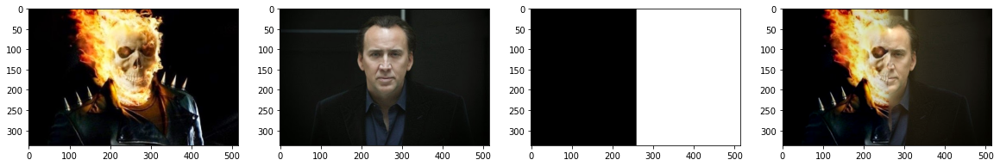

In [ ]:
ball = [
# Apply the above created function on all (3) pairs of images and show the results
    'soccerball.jpg',
    'baseball.png',
    'soccerball-baseball-mask.png',
]
nc = [
    'ghost-rider.jpg', 
    'nicolas-cage.jpg', 
    'ghost-rider-nicolas-cage-mask.jpg',
    ]
hq = [
    'quinn.jpg', 
    'robbie.jpg', 
    'quinn-robbie-mask.jpg',
]
imgpaths = [ball, hq, nc]
imgsgroup = [[cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB) for img in group] for group in imgpaths]
for group in imgsgroup:
    fig, axs = plt.subplots(1,4)
    axs[0].imshow(group[0])
    axs[1].imshow(group[1])
    axs[2].imshow(group[2])
    axs[3].imshow(blend(group[0], group[1], group[2], 8))

#Submission Instructions

1.   Complete all tasks above
2.   Export this notebook as .ipynb
      (File > Download as ipynb)
4.   Upload the .ipynb file on Blackboard

##Rubric

*   (45 points) Implement Filtering Function
*   (15 points) Apply different filters to the above function
*   (50 points) Implement Blending Function
*   (15 points) Apply blending on different images